In [56]:
#!pip install --upgrade pip
#!pip install influxdb
#!pip install psycopg2
#!pip install etna
#!pip install umap-learn
#!pip install tslearn
#!pip install --user etna
#!pip uninstall numba
#!python3 -m pip install numba

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import seaborn as sns
import time
import os
import warnings
warnings.filterwarnings('ignore')

from preprocessing import optimize_freq, resample_df
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import distance
from sklearn.manifold import TSNE
from IPython.display import Image

In [61]:
import pickle 

#with open('saved_tss.pkl', 'wb') as f:
#    pickle.dump(tss, f)
        
with open('saved_tss.pkl', 'rb') as f:
    tss = pickle.load(f)
    

**timestamp** - время измерения
<br>**target** - значение


In [62]:
tss['monitoringMetric$20221722__WEEK']

,timestamp,target
0,2023-07-13 00:00:00.013000+00:00,8.498525e+09
1,2023-07-13 00:00:59.998000+00:00,1.022410e+10
2,2023-07-13 00:01:59.997000+00:00,7.818465e+09
3,2023-07-13 00:02:59.997000+00:00,8.773831e+09
4,2023-07-13 00:03:59.993000+00:00,8.635361e+09
...,...,...
9378,2023-07-19 16:56:59.991000+00:00,1.156298e+10
9379,2023-07-19 16:58:59.993000+00:00,1.063899e+10
9380,2023-07-19 17:02:00.009000+00:00,9.164282e+09
9381,2023-07-19 17:02:59.994000+00:00,1.409678e+10


In [63]:
tss_summary = pd.DataFrame([(name, 
                             name.split('__')[1], 
                             ts['timestamp'].values[0], 
                             ts['timestamp'].values[-1], 
                             ts['timestamp'].values[-1] - ts['timestamp'].values[0],
                             len(ts['timestamp'])) for (name, ts) in tss.items()], 
                             columns = ['name', 'retention policy', 'first date', 'last date', 'history', 'count'])

общая сводка по продолжительности временных рядов:

**name** - название временного ряда
<br>**retention policy** - категория периода времени за который хранятся значения (DAY, WEEK, MONTH, HALF_YEAR, INFINITE)
<br>**first date** - начальное время
<br>**last date** - последнее время
<br>**history** - общая продолжительность
<br>**count** - количество элементов ряда

In [64]:
tss_summary

,name,retention policy,first date,last date,history,count
0,monitoringMetric$20221722__WEEK,WEEK,2023-07-13 00:00:00.013,2023-07-19 17:04:00.003,6 days 17:03:59.990000,9383
1,monitoringMetric$20221723__WEEK,WEEK,2023-07-13 00:00:00.013,2023-07-19 17:04:00.003,6 days 17:03:59.990000,9383
2,monitoringMetric$20221727__WEEK,WEEK,2023-07-16 23:42:00.006,2023-07-16 23:42:00.006,0 days 00:00:00,1
3,monitoringMetric$20221729__WEEK,WEEK,2023-07-16 23:42:00.006,2023-07-16 23:42:00.006,0 days 00:00:00,1
4,monitoringMetric$20221730__WEEK,WEEK,2023-07-13 00:00:00.013,2023-07-19 17:04:00.003,6 days 17:03:59.990000,9383
...,...,...,...,...,...,...
1540,monitoringMetric$27568701__WEEK,WEEK,2023-07-13 00:00:00.013,2023-07-19 17:04:00.003,6 days 17:03:59.990000,9364
1541,monitoringMetric$27568702__WEEK,WEEK,2023-07-13 00:00:00.013,2023-07-19 17:04:00.003,6 days 17:03:59.990000,9364
1542,monitoringMetric$28929201__WEEK,WEEK,2023-07-16 04:00:59.995,2023-07-16 16:00:00.004,0 days 11:59:00.009000,698
1543,monitoringMetric$28929202__WEEK,WEEK,2023-07-18 21:01:00.008,2023-07-19 17:04:00.003,0 days 20:02:59.995000,1173


In [65]:
tss_summary[tss_summary['retention policy'] == 'HALF_YEAR']

,name,retention policy,first date,last date,history,count
1331,monitoringMetric$20225925__HALF_YEAR,HALF_YEAR,2023-01-23 10:49:00.591,2023-07-19 17:04:00.003,177 days 06:14:59.412000,240342


<br>
выведем промежутки времени (частоты) между соседними элементами для какого-либо ряда (столбец 'delta (min)')

In [66]:
tss['monitoringMetric$20225925__HALF_YEAR']['delta (min)'] = tss['monitoringMetric$20225925__HALF_YEAR']['timestamp'].diff() \
                                                             .dt.total_seconds() / 60
ts = tss['monitoringMetric$20225925__HALF_YEAR']

In [57]:
ts

,timestamp,target,delta (min)
0,2023-01-23 10:49:00.591000+00:00,120522.0,NaN
2,2023-01-23 10:50:00.007000+00:00,120472.0,0.990267
4,2023-01-23 10:51:00.046000+00:00,120539.0,1.000650
6,2023-01-23 10:52:00.012000+00:00,120497.0,0.999433
8,2023-01-23 10:53:00.007000+00:00,120572.0,0.999917
...,...,...,...
480662,2023-07-19 16:56:59.991000+00:00,127369.0,1.000000
480664,2023-07-19 16:58:59.993000+00:00,127373.0,2.000033
480666,2023-07-19 17:02:00.009000+00:00,127426.0,3.000267
480668,2023-07-19 17:02:59.994000+00:00,127432.0,0.999750


частоты между некоторыми соседними элементами отличается от основной частоты (1 мин):

In [67]:
ts[ts['delta (min)'] > 5]

,timestamp,target,delta (min)
22277,2023-01-31 04:41:00.008000+00:00,97277.0,13.999917
24969,2023-02-01 03:18:00.012000+00:00,94001.0,12.000100
25481,2023-02-03 07:14:00.031000+00:00,89813.0,2861.000333
27192,2023-02-06 12:53:00.571000+00:00,95744.0,3803.598233
34352,2023-02-09 04:18:00.006000+00:00,104403.0,209.000033
50064,2023-02-14 15:27:00.007000+00:00,96109.0,11.000017
51308,2023-02-15 02:48:00.003000+00:00,61190.0,59.999967
55130,2023-02-16 10:52:00.005000+00:00,60435.0,13.999917
66624,2023-02-20 10:58:00.007000+00:00,58575.0,20.000017
134678,2023-03-16 02:20:00.013000+00:00,77187.0,15.000083


<br>
группируем ряды по периоду времени, пустые ряды не учитываем:

In [68]:
tss_rp = {}

for name, ts in tss.items():
    rp = name.split('__')[1]
    if not ts['target'].values.any():
        continue
    if (rp in tss_rp):
        tss_rp[rp][name] = ts
    else:
        tss_rp[rp] = {name:ts}


In [69]:
# список периодов

tss_rp.keys()

dict_keys(['WEEK', 'INFINITE', 'MONTH', 'NONE', 'DAY', 'HALF_YEAR'])

In [70]:
# количество непустых рядов

sum(map(len, tss_rp.values()))

855

In [71]:
# количество непустых рядов для каждого периода времени

for rp, ts_s in tss_rp.items():
    print('rp =', rp, ' count =', len(ts_s))

rp = WEEK  count = 788
rp = INFINITE  count = 11
rp = MONTH  count = 39
rp = NONE  count = 6
rp = DAY  count = 10
rp = HALF_YEAR  count = 1


<br>
визуализируем продолжительность рядов для периодов DAY, WEEK, MONTH:

In [ ]:
fig = plt.figure(figsize=(200, 170))
ax = fig.add_axes([0, 0, 1, 1])
ax.set_ylim(-5, 850)

ii = 0

for rp in ['DAY', 'WEEK', 'MONTH']:
    i = 0
    for i, (name, ts) in enumerate(tss_rp[rp].items()):
        plt.scatter(ts['timestamp'], [i+ii+1]*len(ts['timestamp']))
        plt.annotate(text=name, xy=(ts['timestamp'].values[-1], i+ii+1))
    ii += i + 1

<br>
визуализируем продолжительность рядов для периодов HALF_YEAR, INFINITE, NONE:

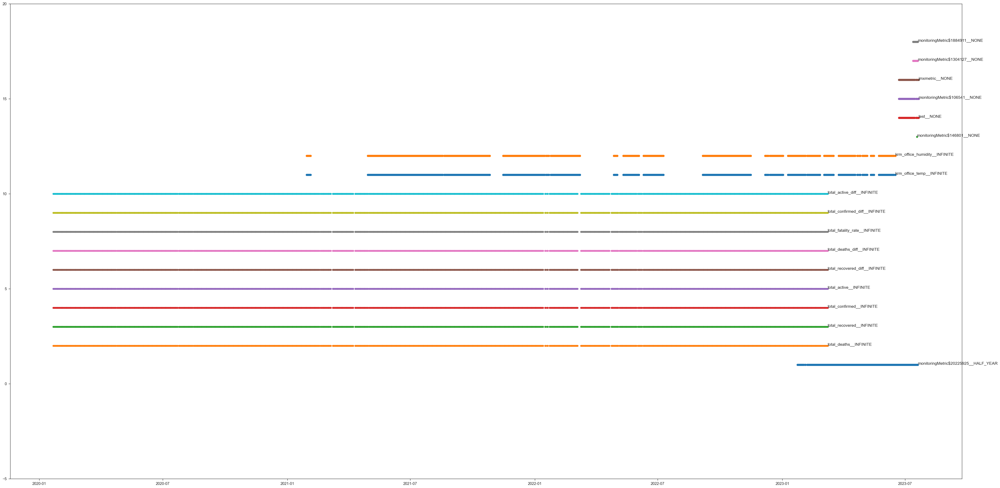

In [73]:
fig = plt.figure(figsize=(40, 20))
ax = fig.add_axes([0, 0, 1, 1])
ax.set_ylim(-5, 20)

ii = 0

for rp in ['HALF_YEAR', 'INFINITE', 'NONE']:
    i = 0
    for i, (name, ts) in enumerate(tss_rp[rp].items()):
        plt.scatter(ts['timestamp'], [i+ii+1]*len(ts['timestamp']))
        plt.annotate(text=name, xy=(ts['timestamp'].values[-1], i+ii+1))
    ii += i + 1

<br>
выведем среднюю частоту в секундах для рядов из DAY и количество рядов с такой частотой:

In [74]:
freqs, counts = np.unique(
            [round(ts['timestamp'].diff().dt.total_seconds().median()) for name, ts in tss_rp['DAY'].items()], 
            return_counts=True)

print(dict(zip(freqs, counts)))

{10: 1, 30: 8, 600: 1}


<br>
выведем самое позднее начальное время и самое раннее конечное время среди рядов из DAY

In [75]:
left_times = [(name, ts['timestamp'].values[0]) for name, ts in tss_rp['WEEK'].items()]
right_times = [(name, ts['timestamp'].values[-1]) for name, ts in tss_rp['WEEK'].items()]

print(max(left_times, key = lambda x : x[1]))
print(min(right_times, key = lambda x : x[1]))

('monitoringMetric$20221789__WEEK', numpy.datetime64('2023-07-19T13:40:59.990000000'))
('monitoringMetric$20226723__WEEK', numpy.datetime64('2023-07-13T18:59:59.993000000'))



<br>**in_period_tss** - словарь, который для периода ('INFINITE', 'HALF_YEAR', 'MONTH', 'WEEK', 'DAY')<br>
хранит ряды, которые пересекаются с данным периодом

In [76]:
periods = ['INFINITE', 'HALF_YEAR', 'MONTH', 'WEEK', 'DAY']

in_period_tss = {period:{} for period in periods}
                    
for period in periods:

    left_times = sorted([pd.Timestamp(ts['timestamp'].values[0]) for name, ts in tss_rp[period].items()])
    right_times = sorted([pd.Timestamp(ts['timestamp'].values[-1]) for name, ts in tss_rp[period].items()])
    
    # медиана начального времени по всем рядам + 10мин
    left_time = left_times[len(left_times) // 2] + pd.Timedelta('10T')
    # медиана последнего времени по всем рядам - 10мин
    right_time = right_times[len(right_times) // 2] - pd.Timedelta('10T')

    left_time = pd.to_datetime(left_time)
    right_time = pd.to_datetime(right_time)
    
    for ts_s in list(tss_rp.values()):
        for name, ts in ts_s.items():
            if (ts['timestamp'].values[0] <= left_time) and (ts['timestamp'].values[-1] >= right_time):
                in_period_tss[period][name] = ts

<br>
для каждого периода выведем среднюю частоту в секундах и количество рядов с такой частотой:

In [77]:
print('\nчастоты рядов которые попали в периоды:\n')

for period in periods:
    freqs, counts = np.unique(
                [round(ts['timestamp'].diff().dt.total_seconds().median()) for name, ts 
                 in in_period_tss[period].items()
                 if len(ts) > 1], 
                return_counts=True)

    freqs_count = dict(sorted(dict(zip(freqs, counts)).items(), key=lambda x : x[1], reverse=True))
    
    print('Период: '+'{:10s}'.format(period), 'частота:количество рядов', freqs_count)


частоты рядов которые попали в периоды:

Период: INFINITE   частота:количество рядов {86400: 9}
Период: HALF_YEAR  частота:количество рядов {60: 1}
Период: MONTH      частота:количество рядов {60: 20, 300: 11, 10: 5, 120: 1, 600: 1}
Период: WEEK       частота:количество рядов {60: 787, 300: 12, 10: 7, 600: 2, 120: 1, 3600: 1}
Период: DAY        частота:количество рядов {60: 30, 300: 12, 10: 8, 30: 8, 600: 3, 120: 1, 3600: 1}


<br>
для каждого периода выведем оптимальные частоты рядов (только для рядов c количеством точек больше 2), которые попали в периоды и количество рядов с такой оптимальной частотой:

алгоритм вычисления оптимальной частоты:
1. делаем ресемплинг входного ряда с частотой равной медиане частот.
2. строим сетку частот от частоты, равной медиане частот, до наибольшей возможной частоты (1 день) с заданным количеством элементов в сетке частот
3. бинарным поиском находим лучшую частоту downsampling'а - частота с которой ресемплированный (downsampling + upsampling) ряд 
будет иметь наибольшую ошибку, меньшую заданного порога, с ресемплированным частотой равной медиане рядом (поточеченое MSE между рядами).

In [78]:
print('\nоптимальные частоты рядов которые попали в периоды:\n')

threshold = 0.01

for period in periods:

    optim_freqs = [optimize_freq(ts, threshold=threshold) for ts in in_period_tss[period].values() if len(ts) > 2]
    freqs, counts = np.unique(optim_freqs, return_counts=True)
    freqs_count = dict(sorted(dict(zip(freqs, counts)).items(), key=lambda x : x[1], reverse=True))
    
    print('Период: '+'{:10s}'.format(period), 'оптимальная частота:количество рядов', freqs_count)


оптимальные частоты рядов которые попали в периоды:

Период: INFINITE   оптимальная частота:количество рядов {'86400S': 9}
Период: HALF_YEAR  оптимальная частота:количество рядов {'86400S': 1}
Период: MONTH      оптимальная частота:количество рядов {'300S': 9, '60S': 8, '1590S': 5, '86400S': 5, '1260S': 2, '1060S': 1, '120S': 1, '1410S': 1, '2660S': 1, '500S': 1, '510S': 1, '570S': 1, '6580S': 1, '950S': 1}
Период: WEEK       оптимальная частота:количество рядов {'86400S': 137, '60S': 117, '650S': 59, '14690S': 35, '590S': 27, '500S': 21, '950S': 17, '630S': 16, '1260S': 12, '570S': 12, '800S': 11, '300S': 10, '350S': 9, '510S': 9, '200S': 8, '270S': 8, '610S': 8, '330S': 7, '380S': 7, '530S': 7, '660S': 7, '720S': 7, '970S': 7, '1560S': 6, '320S': 6, '80S': 6, '830S': 6, '1590S': 5, '250S': 5, '290S': 5, '680S': 5, '700S': 5, '70S': 5, '10090S': 4, '10400S': 4, '1100S': 4, '13130S': 4, '1410S': 4, '2480S': 4, '420S': 4, '520S': 4, '740S': 4, '11000S': 3, '1140S': 3, '1180S': 3, '1252

The history_size 46228 in freq optimizer is less than min_history_size 172800
The history_size 46290 in freq optimizer is less than min_history_size 172800
The history_size 46317 in freq optimizer is less than min_history_size 172800
The history_size 46290 in freq optimizer is less than min_history_size 172800
The history_size 46317 in freq optimizer is less than min_history_size 172800
The history_size 46380 in freq optimizer is less than min_history_size 172800
The history_size 46199 in freq optimizer is less than min_history_size 172800
The history_size 46887 in freq optimizer is less than min_history_size 172800
The history_size 46942 in freq optimizer is less than min_history_size 172800
The history_size 46941 in freq optimizer is less than min_history_size 172800


Период: DAY        оптимальная частота:количество рядов {'60S': 14, '300S': 10, '86400S': 7, '30S': 6, '1590S': 5, '10S': 2, '1260S': 2, '500S': 2, '1060S': 1, '120S': 1, '1350S': 1, '1410S': 1, '23090S': 1, '2660S': 1, '3600S': 1, '400S': 1, '440S': 1, '510S': 1, '5680S': 1, '570S': 1, '6580S': 1, '80S': 1, '950S': 1}



<br>предобработка рядов:
- усечение рядов периода до заданных границ (левая граница = медиана начального времени по всем рядам периода + 10мин<br>
  правая граница = медиана последнего времени по всем рядам периода - 10мин)<br>
- ресемплирование с заданной частотой<br>
- интерполирование получаемых после ресемплирования пустых значений<br>
- удаляем пустые ряды которые могли появиться снова после усечения<br>
- удаляем константные ряды<br>
- minmax масштабирование<br>
            
**r_i_c_s_freq_period_group_ts** - словарь который для заданной оптимальной частоты и заданного периода хранит предобработанные ряды (resampled interpolated clipped scaled)

In [79]:
optim_freqs = ['60S', '650S']

periods = ['INFINITE', 'HALF_YEAR', 'MONTH', 'WEEK', 'DAY']

r_i_c_s_freq_period_group_ts = {optim_freq:{period:{} for period in periods} for optim_freq in optim_freqs}

# для визуализации рядов в методе plot_tss_in_clusters
clipped_period_group_ts = {optim_freq:{period:{} for period in periods} for optim_freq in optim_freqs}


for period in periods:

    left_times = sorted([ts['timestamp'].min() for name, ts in tss_rp[period].items()])
    right_times = sorted([ts['timestamp'].max() for name, ts in tss_rp[period].items()])
    
    left_time = left_times[len(left_times) // 2] + pd.Timedelta('10T')
    right_time = right_times[len(right_times) // 2] - pd.Timedelta('10T')

    for optim_freq in optim_freqs:
        for name, ts in in_period_tss[period].items():

            clipped_ts = ts[(ts['timestamp'] >= left_time) & (ts['timestamp'] <= right_time)]

            resampled_ts = resample_df(ts, freq=optim_freq, return_freq=False)
            resampled_interpolated_ts = resampled_ts.copy()
            resampled_interpolated_ts['target'] = resampled_interpolated_ts['target'].interpolate(limit_direction="both")
            resampled_interpolated_clipped_ts = resampled_interpolated_ts.copy()
            resampled_interpolated_clipped_ts = resampled_interpolated_clipped_ts[
                                                    (resampled_interpolated_clipped_ts['timestamp'] >= left_time) & 
                                                    (resampled_interpolated_clipped_ts['timestamp'] <= right_time)]
            r_i_c_s_ts = resampled_interpolated_clipped_ts.copy()

            # после усечения снова могли появиться нулевые ряды, которые не нужно добавлять,
            # также не нужно добавлять константные ряды
            if r_i_c_s_ts['target'].any() and len(r_i_c_s_ts['target'].unique()) > 1:
                
                r_i_c_s_ts['target'] = MinMaxScaler().fit_transform(r_i_c_s_ts[['target']])

                clipped_period_group_ts[optim_freq][period][name] = clipped_ts
                r_i_c_s_freq_period_group_ts[optim_freq][period][name] = r_i_c_s_ts
                

In [80]:
period = 'DAY'
freq = '60S'

len(r_i_c_s_freq_period_group_ts[freq][period])

44

In [81]:
# количество непустых рядов перед усечением

sum([ts['target'].any() for rp, ts_s in tss_rp.items() for name, ts in ts_s.items()])

855

<br>
некоторые ряды за период DAY без ресэмплинга, интерполяции, масштабирования:

In [ ]:
plt.figure(figsize=(80, 600))

left_time = max([ts['timestamp'].values[0] for name, ts in tss_rp[period].items()]) + pd.Timedelta('30S')
right_time = min([ts['timestamp'].values[-1] for name, ts in tss_rp[period].items()]) - pd.Timedelta('30S')

for i, (name, ts) in enumerate(in_period_tss[period].items()):

    ts1 = ts[(ts['timestamp'].values >= left_time) & (ts['timestamp'].values <= right_time)]

    if ts1['target'].any():
        if i > 99:
            break
        plt.subplot(100, 1, i+1)
        plt.plot(ts1['timestamp'], ts1['target'])


<br>
некоторые ряды за период DAY после предобработки:

In [84]:
freq = '60S'
period = 'DAY'

plt.figure(figsize=(80, 600))

for i, (name, ts) in enumerate(r_i_c_s_freq_period_group_ts[freq][period].items()):
    if i > 99:
        break
    plt.subplot(100, 1, i+1)
    plt.plot(ts['timestamp'], ts['target'])
    

<br>
визуализируем продолжительность предобработанных рядов за выбранную частоту и период:

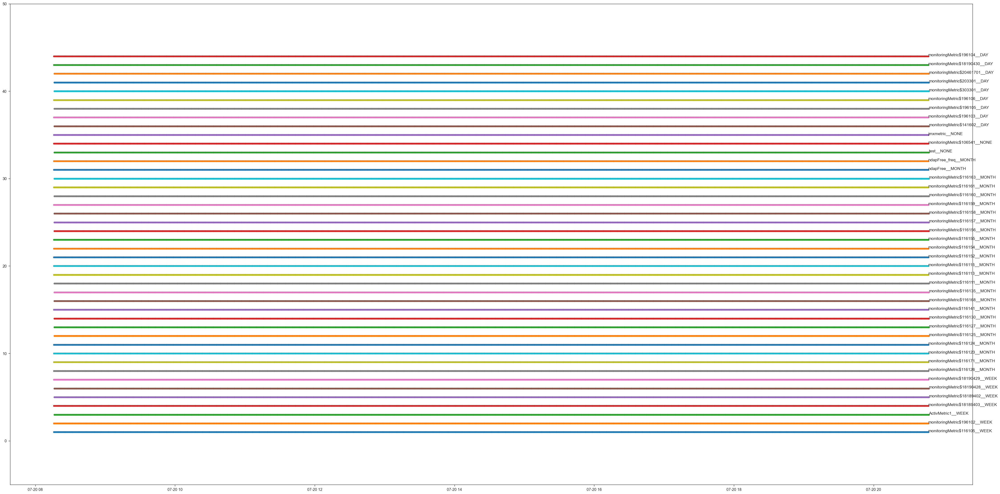

In [92]:
fig = plt.figure(figsize=(40, 20))
ax = fig.add_axes([0, 0, 1, 1])
ax.set_ylim(-5, 50)

period = 'DAY'
freq = '60S'


for i, (name, ts) in enumerate(r_i_c_s_freq_period_group_ts[freq][period].items()):
    
    first_time = ts['timestamp'].values[0]
    last_time = ts['timestamp'].values[-1]

    plt.scatter(ts['timestamp'], [i+1]*len(ts['timestamp']))
    plt.annotate(text=name, xy=(ts['timestamp'].values[-1], i+1))


<br>
вычислим среднюю частоту предобработанных рядов за выбранную частоту и период:

In [93]:
period = 'DAY'
frequency = '60S'

freqs, counts = np.unique(
                    [round(ts['timestamp'].diff().dt.total_seconds().median()) 
                         for name, ts in r_i_c_s_freq_period_group_ts[frequency][period].items()], 
                    return_counts=True)

print(dict(zip(freqs, counts)), sep="\n")

{60: 44}


<br>
посчитаем количество точек в каждом предобработанном ряду за выбранную частоту и период и количество рядов с таким количеством точек:

In [94]:
period = 'MONTH'
freq = '60S'

freqs, counts = np.unique([len(ts['target']) 
                              for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items()], return_counts=True)

print(dict(zip(freqs, counts)), sep="\n")

{41555: 14, 41556: 18}


In [95]:
# если появились ряды с меньшей длиной (отличается на 1) nо вставляем у них в конце NaN и интерполируем его

for period in periods:
    
    for freq in optim_freqs:
        maxlen = max([len(ts['target']) for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items()])

        for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items():
            if len(ts['target']) < maxlen:
                last_timestamp, last_target = ts['timestamp'].loc[ts.index[-1]], ts['target'].loc[ts.index[-1]]
                ts.loc[ts.index[-1]+1] = [last_timestamp + pd.Timedelta(freq), last_target]

In [96]:
first_times_day = {ts['timestamp'].min() for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items()}
first_times_day

{Timestamp('2023-07-20 08:17:55+0000', tz='UTC'),
 Timestamp('2023-07-20 08:23:20+0000', tz='UTC')}

In [97]:
last_times_day = {ts['timestamp'].max() for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items()}
last_times_day

{Timestamp('2023-07-20 20:45:25+0000', tz='UTC'),
 Timestamp('2023-07-20 20:50:50+0000', tz='UTC')}

<br>
выведем ряды которые не попали в периоды после обработки:

In [98]:
names_tss_all = {name for ts_s in tss_rp.values() for name, ts in ts_s.items()}
names_tss_in_periods_processed = {name for ts_s in r_i_c_s_freq_period_group_ts[freq].values() 
                                       for name, ts in ts_s.items()}

excluded_after_processing_tss_names = names_tss_all - names_tss_in_periods_processed
excluded_after_processing_tss_names

{'akom_const_str__MONTH',
 'krm_office_humidity__INFINITE',
 'krm_office_temp__INFINITE',
 'monitoringMetric$116129__MONTH',
 'monitoringMetric$1304127__NONE',
 'monitoringMetric$146801__NONE',
 'monitoringMetric$16936236__MONTH',
 'monitoringMetric$16936237__MONTH',
 'monitoringMetric$16936238__MONTH',
 'monitoringMetric$20221727__WEEK',
 'monitoringMetric$20221729__WEEK',
 'monitoringMetric$20221788__WEEK',
 'monitoringMetric$20221789__WEEK',
 'monitoringMetric$20225935__WEEK',
 'monitoringMetric$20225936__WEEK',
 'monitoringMetric$20225937__WEEK',
 'monitoringMetric$20225938__WEEK',
 'monitoringMetric$20225946__WEEK',
 'monitoringMetric$20225947__WEEK',
 'monitoringMetric$20225953__WEEK',
 'monitoringMetric$20225954__WEEK',
 'monitoringMetric$20225955__WEEK',
 'monitoringMetric$20225956__WEEK',
 'monitoringMetric$20225957__WEEK',
 'monitoringMetric$20225960__WEEK',
 'monitoringMetric$20225961__WEEK',
 'monitoringMetric$20225962__WEEK',
 'monitoringMetric$20225963__WEEK',
 'monitorin

<br>
посмотрим на ряды которые не добавились после обработки (в необработанном виде):

In [ ]:
freq = '60S'
period = 'DAY'

plt.figure(figsize=(20, 400))

i = 1

for name, ts in tss.items():
    if name in excluded_after_processing_tss_names:
        plt.subplot(len(excluded_after_processing_tss_names), 1, i)
        plt.plot(ts['timestamp'], ts['target'])
        i += 1
    

<br>
Видно что основная часть недобавленных рядов - константные ряды.
<br>Посмотрим есть ли неконстантные недобавленные ряды:

In [100]:
tss_all_not_constant = {name for ts_s in tss_rp.values() for name, ts in ts_s.items() if len(ts['target'].unique()) > 1}
tss_in_periods_processed = {name for ts_s in r_i_c_s_freq_period_group_ts[freq].values() for name, ts in ts_s.items()}

excluded_not_constant = tss_all_not_constant - tss_in_periods_processed
excluded_not_constant

{'krm_office_humidity__INFINITE',
 'krm_office_temp__INFINITE',
 'monitoringMetric$146801__NONE',
 'monitoringMetric$20221788__WEEK',
 'monitoringMetric$20227999__WEEK',
 'monitoringMetric$20228704__WEEK',
 'monitoringMetric$21363980__WEEK',
 'monitoringMetric$24856303__WEEK'}

<br><br>
Визуализируем продолжительность рядов для периодов DAY, WEEK, MONTH.<br>
Имена исключенных неконстантных рядов выделены красным цветом

In [ ]:
fig = plt.figure(figsize=(200, 170))
ax = fig.add_axes([0, 0, 1, 1])
ax.set_ylim(-5, 850)

ii = 0

for rp in ['DAY', 'WEEK', 'MONTH']:
    i = 0
    for i, (name, ts) in enumerate(tss_rp[rp].items()):
        plt.scatter(ts['timestamp'], [i+ii+1]*len(ts['timestamp']))
        if name in excluded_not_constant:
            plt.annotate(text=name + ' excluded', xy=(ts['timestamp'].values[-1], i+ii+1), color='r')
        else:
            plt.annotate(text=name, xy=(ts['timestamp'].values[-1], i+ii+1))
    ii += i + 1

<br>
<br>

# Метрики

### Неконтролируемые метрики качества (метки неизвестны)
- **коэффициент силуэта**
- **Calinski-Harabasz Index**<br>
  Отношение суммы междукластерных дисперсий к внутрикластерным дисперсиям по всем кластерам (внутрекластерная дисперсия - сумма квадратов расстояний от точек до центров их кластеров, междукластерная дисперсия - сумма квадратов расстояний от центров кластеров до центра всех точек выборки, умноженных на количество точек в кластере).
- **Davies-Bouldin Index**<br>
  Среднее «сходство» между кластерами, где сходство — это мера, которая сравнивает расстояние между кластерами с размером самих   кластеров.

### Метрики для выбора количества кластеров
- **коэффициент силуэта**
- **Локтевой метод (Elbow method)**<br>
  Строится график зависимости суммы квадратов внутрикластерных расстояний от количества кластеров.<br>
  Изгиб указывает на то, что дополнительные кластеры после определенного не имеют большого значения
- **статистика разрыва (gap statistic)**<br>
  Статистика разрыва сравнивает сумму внутрикластерных расстояний с их ожидаемыми значениями при нулевом (как правило 
  равномерном) эталонном распределении данных.<br>
  Делается кластеризация выборки из нулевого распределения.
  Считается логарифм отношения суммы внутрикластерных расстояний для выборки из нулевого распределения к сумме внутрикластерных   расстояний нашей кластеризации.<br>
  Оптимальное количество кластеров - значение, при котором статистика разрыва максимальна. Это означает, что структура кластеризации далека от случайного равномерного распределения точек.


In [102]:
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

In [103]:
# сумма квадратов внутрикластерных расстояний (WSS, within-cluster sum of square)

def withinClusterDistanceSquaredSum(x, x_cluster_labels, n_clusters):

    """
    Params:
        x - данные
        x_cluster_labels - метки кластеров данных
        n_clusters - количество кластеров

    Returns: squared_dists_rand_sum - сумма квадратов внутрикластерных расстояний
    """
    
    squared_dists_rand_sum = 0

    for i_cluster in range(n_clusters):
        x_i_cluster = x[x_cluster_labels == i_cluster]
        
        # матрица попарных расстояний между точками
        distances = distance.cdist(x_i_cluster, x_i_cluster, 'euclidean')
        squared_distances = distances ** 2
        
        # берем у матрицы попарных расстояний только сумму элементов диагонали (равны 0) и выше нее 
        # чтобы не добавлять в сумму расстояния между одними и теми же точками
        upper_sum = np.triu(squared_distances).sum()
        squared_dists_rand_sum += upper_sum
    
    return squared_dists_rand_sum


In [104]:
# статистика разрыва

def gap_statistic(data, x_cluster_labels, n_clusters, nrefs=3):
    
    """
    Params:
        x - данные
        x_cluster_labels - метки кластеров данных
        n_clusters - количество кластеров
        nrefs - количество генерируемых выборок равномерного ораспределения.
                Вычисляется средняя по всем nrefs сумма квадратов внутрикластерных расстояний

    Returns: gap
    """

    refDisps = []

    for i in range(nrefs):

        # создаем точки из равномерного распределения
        randomReference = np.random.random_sample(size=x.shape)

        # кластеризируем точки равномерного распределения
        ae = n2d.AutoEncoder(randomReference.shape[-1], n_clusters)
        manifold_clusterer = n2d.UmapGMM(n_clusters)
        harcluster = n2d.n2d(ae, manifold_clusterer)

        harcluster.fit(randomReference, epochs=500, verbose=0)
        n2d_labels = harcluster.predict(randomReference)

        # Сумма квадратов внутрикластерных расстояний для точек равномерного распределения
        refDisps.append(withinClusterDistanceSquaredSum(randomReference, n2d_labels, n_clusters))       


    # Сумма квадратов внутрикластерных расстояний наших точек данных
    squared_dists_ts_sum = withinClusterDistanceSquaredSum(x, x_cluster_labels, n_clusters)

    gap = np.log(np.mean(refDisps)) - np.log(squared_dists_ts_sum)   
  
    return gap


In [105]:
# Левый график: Для каждого кластера значения коэффициента силуэта для всех 
# точек кластера: точки кластера расположены по вертикальной оси, правый край отрезка показывает  
# значение коэффициента силуэта для точки.
# Пунктирная линия - среднее (по всей выборке) значение коэффициента силуэта.
# Правый график: точки в 2-мерном пространстве (размерность эмбеддингов рядов) окрашенные в цвет своего кластера

def plot_silhouette(X, cluster_labels, n_clusters):

    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])

    # (n_clusters+1)*10 для вставки пустой строки между графиками отдельных кластеров, 
    # чтобы четко их разграничить.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])


    # silhouette_score возвращает среднее значение по всем образцам.
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # silhouette_samples вычисляет silhouette scores для каждого образца
    sample_silhouette_values = silhouette_samples(X, cluster_labels)


    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # вычисляем new y_lower для следующего графика
        y_lower = y_upper + 10


    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    plt.show()

In [106]:
# графики зависимости силуэта, gap-статистики, elbow-метода от количества кластеров

def plot_silhouettes(silhouettes):
    
    plt.plot(silhouettes, linewidth=3, label = 'freq ='+freq)
    plt.legend(loc='upper left')

    plt.xlabel('cluster count')
    plt.ylabel('silhouette Value')
    plt.xticks(silhouettes.index)
    plt.title('silhouette by cluster count')
    idxmax = silhouettes.idxmax()
    plt.scatter(idxmax, silhouettes.loc[idxmax], s=250, c='r')
    plt.grid(True)


def plot_gap_statistics(gap_statistics):
    
    plt.plot(gap_statistics, linewidth=3, label = 'freq ='+freq)
    plt.legend(loc='upper left')
    
    plt.xlabel('cluster count')
    plt.ylabel('gap statistic')
    plt.xticks(gap_statistics.index)
    plt.title('gap statistic by cluster count')
    idxmax = gap_statistics.idxmax()
    plt.scatter(idxmax, gap_statistics.loc[idxmax], s=250, c='r')
    plt.grid(True)


def plot_elbows(elbows):
    
    plt.plot(elbows, linewidth=3, label = 'freq ='+freq)
    plt.legend(loc='upper left')
    
    plt.xlabel('cluster count')
    plt.ylabel('elbow')
    plt.xticks(elbows.index)
    plt.title('elbow by cluster count')
    idxmin = elbows.idxmin()
    plt.scatter(idxmin, elbows.loc[idxmin], s=250, c='r')
    plt.grid(True)
    

In [107]:
def plot_tss_in_clusters(r_i_c_s_freq_period_group_ts, 
                         tss_clasterizations, 
                         freq, period, n_clusters,
                         kind=['all', 'splitted'],
                         algo=''):
    """
    вывод рядов в каждом кластере для заданной кластеризации (число кластеров), модели, частоты и периода
    
    Params:
        r_i_c_s_freq_period_group_ts - словарь который для заданной оптимальной частоты и заданного периода хранит 
            предобработанные ряды
        tss_clasterizations - DataFrame меток кластеров для рядов (строки) для заданной частоты и кластеризации (столбцы)
        freq - частота
        period - период
        n_clusters - кластеризация (количество кластеров)
        kind=['all', 'splitted'] - вид отображения: splitted - каждый кластер одним столбцов в отдельном файле
                                                    all - все кластеры в одном файле в своем столбце
        algo - название модели (для печати)
    """

    names = [name for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items()]
    tss = {name:ts for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items()}
    tsscount = len(r_i_c_s_freq_period_group_ts[freq][period])

    labels = tss_clasterizations.loc[names, (freq, str(n_clusters) + ' кластеров')].values
    labels_names = tss_clasterizations.loc[names, (freq, str(n_clusters) + ' кластеров')].index.values
    labels_np = np.array(labels)

    
    if 'splitted' in kind:
        
        i = 0
        
        directory = 'Кластеры (раздельно) ' + 'algo_' + algo + ' freq_'+ freq + ' period_' \
                                            + str(period) + ' кластеров_' + str(n_clusters)
        if not os.path.exists(directory):
            os.makedirs(directory)

        for i_cluster in range(n_clusters):
            
            i_cluster_labels_names = labels_names[labels_np == i_cluster]
            size = len(i_cluster_labels_names)
            
            fig, axes = plt.subplots(nrows=size+1, ncols=1, figsize=(40, min(5*size, 500)))
            axes[i].text(0.05, 0.3, '\nПериод: {}\nЧастота: {}\nКоличество кластеров: {}'
                         .format(period, freq, n_clusters), fontsize=40)
            axes[i].text(0.4, 0.0, 'Кластер {}'.format(i_cluster), fontsize=50)
            axes[i].axis('off')
            i += 1
            plt.subplots_adjust(hspace=0.5)

            for name in i_cluster_labels_names:
                axes[i].plot(tss[name]['timestamp'].values, tss[name]['target'].values, label = name)
                axes[i].legend(loc='upper left', fontsize=15)
                i += 1
                
            i = 0
            
            fig.savefig(directory + '/Кластер {}.jpg'.format(i_cluster))
        

    if 'all' in kind:
        
        _, cluster_sizes = np.unique(labels, return_counts=True)
        max_cluster_size = max(cluster_sizes)
        
        i = 0
        
        fig_width = min(30 * n_clusters, 350)
        fig_height = min(3 * max_cluster_size, 350)

        fig, axes = plt.subplots(nrows=max_cluster_size+1, ncols=n_clusters, figsize=(fig_width, fig_height))
        fig.suptitle('\nПериод: {}\nЧастота: {}\nКоличество кластеров: {}'.format(period, freq, n_clusters), fontsize=170)
        plt.subplots_adjust(wspace=0.05)
    
        for i_cluster in range(n_clusters):

            i_cluster_labels_names = labels_names[labels_np == i_cluster]
            
            axes[i, i_cluster].text(0.4, 0.0, 'Кластер {}'.format(i_cluster), fontsize=50)
            axes[i, i_cluster].axis('off')
            i += 1

            for name in i_cluster_labels_names:
                axes[i, i_cluster].plot(tss[name]['timestamp'].values, tss[name]['target'].values, label = name)
                axes[i, i_cluster].legend(loc='upper left')
                i += 1
                
            for r in range(i, max_cluster_size+1):
                axes[r, i_cluster].axis('off')
                
            i = 0
                
        fig.savefig('Кластеры (все, горизонтально){}.jpg'.format('algo_' + algo + ' freq_'+ freq 
                                                                 + ' period_' + str(period) 
                                                                 + ' кластеров_' + str(n_clusters)))
        

In [108]:
# визуализация точек в 2-мерном пространстве (размерность эмбеддинга рядов) окрашенных в цвет своего кластера

def visualize_clusters(x, labels):

    plt.style.use(['seaborn-white', 'seaborn-paper'])
    sns.set_context("paper", font_scale=1.3)

    viz_df = pd.DataFrame(data=x)          
    viz_df['Label'] = labels              

    plt.subplots(figsize=(150, 100))
    sns.scatterplot(x=0, y=1, hue='Label', legend='full', hue_order=sorted(viz_df['Label'].unique()), 
                   palette=sns.color_palette("hls", n_colors=n_clusters),
                   alpha=.5,
                   s=2000, 
                   data=viz_df)

    plt.ylabel("")
    plt.xlabel("")
    plt.tight_layout()
    plt.title('Кластеры', fontsize=200, pad=40)

    for i, xy in enumerate(x):
        plt.annotate(text=names[i], xy=(xy[0], xy[1]), fontsize=7)
    

<br>
<br>

# Методы кластеризации

### N2D
- Обучаем и применяем **автоэнкодер** к необработанным данным, чтобы узнать начальные представления точек - эмбеддинги. <br>Функция потерь - MSE
- Дообучаем полученные эмбеддинги с помощью поиска более кластеризируемых представлений  методом **UMAP** - методом обучения многообразиям, который сохраняет локальные расстояния.
<br>UMAP - алгоритм, похожий на t-SNE, но с более сильным математическим обоснованием. При снижении размерности UMAP сначала выполняет построение взвешенного графа, соединяя ребрами только те объекты, которые являются ближайшими соседями. Множество из ребер графа — это нечёткое множество с функцией принадлежности, она определяется как вероятность существования ребра между двумя вершинами. Затем алгоритм создает граф в низкоразмерном пространстве и приближает его к исходному, минимизируя сумму дивергенций Кульбака-Лейблера для каждого ребра из множеств
- На полученных более кластеризуемых эмбеддингах мы применяем окончательный простой алгоритм кластеризации (например **GMM (GaussianMixture)**), чтобы обнаружить кластеры. 
<br>
### IDEC
<img src="img/idec.jpg" width="500" height="500">

- Обучаем и применяем **автоэнкодер** к необработанным данным, чтобы узнать начальные представления точек - эмбеддинги. 
- Одновременно к выходу энкодера автоэнкодера присоединяется **слой кластеризации**, который определяет сходство эмбеддинга с каждым центром кластера.
<br>Вычисляется $q_{ij}$ - сходство между эмбеддингом точки $z_{i}$ и центром кластера $\mu_{j}$ с помощью t-распределения Стьюдента (также как в t-SNE алгоритме). <br>Полученную величину можно интерпретировать как вероятность кластера j для точки i:
<br>
<img src="img/qij.jpg" width="300" height="300">
<br>Вычисляется $p_{ij}$ - вероятность вложенной точки $z_{i}$ в кластере $\mu_{j}$ (p называют целевым распределением):
<img src="img/pij.jpg" width="220" height="220">
<br>
Центры кластеров обновляются оптимизацией функции потерь - Дивергенции Кульбака-Лейблера (KL). <br>На первом шаге можно инициализировать центры любым алгоритмом, например k-means:
<img src="img/KL.jpg" width="400" height="400">
<br>В течении обратного распространения вычисляются градиенты L по $z_{i}$ (передаются для обновления $f_W$ (весов автоэнкодера)) и $\mu_{j}$ (используются для обновления центров кластеров $\mu_{j}$).
<br><br>кластер объекта $i = argmax_j(q_{ij})$
<br>
<br>общая функция потерь:
<img src="img/idec_loss.jpg" width="200" height="200">
$L_{r}$ - функция потерь автоэнкодера - потеря реконструкции (MSE)
<br>$L_{c}$ - потеря кластеризации (KL)
<br>$\gamma > 0$ - коэффициент контролирующий степень искажения вложенного пространства. Чем больше значение, тем эмбеддинги точек будут более кластеризируемыми и менее надежными (хуже представляют исходные ряды)
### k-Shape
k-Shape основан на итерационной процедуре уточнения, аналогичной той, что используется в алгоритме k-means, но со значительными отличиями. В частности, k-Shape использует другую меру расстояния и метод вычисления центроида (центр кластера), отличный от методов k-means. Мера расстояния k-Shape пытается сохранить формы временных рядов при их сравнении. Для этого k-Shape использует меру расстояния, инвариантную к масштабированию (изменение всех значений и промежутков времени в одинаковое число раз не влияет на меру расстояния) и смещению (изменение сдвига одного ряда относительно другого не влияет на меру расстояния) - Shape-based distance (SBD).
<br>**Shape-based distance (SBD)** - мера которая тем меньше чем больше нормированное по автокорреляциям рядов максимальное (по всем сдвигам одного ряда относительно другого) значение кросс-корреляции рядов:
<img src="img/SBD.jpg" width="450" height="450">
<br>
В k-means центроид (центр кластера) вычисляется как средняя последовательность из набора последовательностей — вычисление каждой координаты средней последовательности как среднее арифметическое соответствующих координат всех последовательностей.
<br>
В k-Shape вычисление центроида является задачей оптимизации, цель которой состоит в том, чтобы найти такую последовательность, что сумма квадратов расстояний (по мере SBD) до всех других последовательностей временных рядов будет максимальной:
<img src="img/centr.jpg" width="480" height="480">
<br>
Алгоритм кластеризации:
<br><br>
На каждой итерации k-Shape выполняет два шага: 
- на этапе назначения алгоритм для каждого ряда обновляет принадлежность кластеру, сравнивая каждый временной ряд со всеми вычисленными центроидами и назначая каждый временной ряд кластеру ближайшего центроида, используется мера расстояния SBD для определения принадлежности кластеру 
- на этапе уточнения центроиды кластеров обновляются, чтобы отразить изменения в составе кластеров на предыдущем этапе.

Алгоритм повторяет эти два шага до тех пор, пока либо не произойдет никаких изменений в составе кластеров, либо не будет достигнуто максимально допустимое количество итераций.
<br>


In [109]:
import n2d
from n2d import n2d

In [110]:
def n2d_fit_predict(x, n_clusters, epochs=10):
    
    # гиперпараметры - AutoEncoder:
    #    размер представления
    # гиперпараметры - UMAP:
    #    umap_dim = 2 - Размерность конечного пространства
    #    umap_neighbors = 10 - число соседей
    #    umap_min_distance = 0 - Минимальное расстояние
    #    umap_metric='euclidean' - Метрика расстояния
    #    размер представления = количеству кластеров
    # гиперпараметры - обучение:
    #    количество эпох

    # размер представления = количеству кластеров
    ae = n2d.AutoEncoder(x.shape[-1], n_clusters)
    manifold_clusterer = n2d.UmapGMM(n_clusters, random_state=42)
    harcluster = n2d.n2d(ae, manifold_clusterer)

    harcluster.fit(x, epochs=epochs, verbose=0)
    n2d_labels = harcluster.predict(x)
    x_embed_n2d = harcluster.hle
    
    return (x_embed_n2d, n2d_labels)


In [111]:
import IDEC
import IDEC.DEC

In [112]:
def idec_fit_predict(x, n_clusters, pretrain_epochs=100, maxiter=300):

    # гиперпараметры - AutoEncoder:
    #    размер представления
    # гиперпараметры - кластеризация:
    #    gamma - коэффициент потери кластеризации
    #    количество кластеров
    # гиперпараметры - обучение:
    #    количество эпох
    #    tol - критерий останова - доля объектов у которых за одну итерацию изменяются метки кластеров
    #          с прошлой итерации меньше которой обучение останавливается
    
    batch_size = 32
    maxiter = 300 
    pretrain_epochs = 100 
    gamma = 0.1 

    update_interval = 0
    tol = 0.00001
    ae_weights = None

    optimizer = 'adam'

    if update_interval == 0:  # one epoch
        update_interval = int(x.shape[0]/batch_size)


    # Определение IDEC-модели
    idec = IDEC(dims=[x.shape[-1], 500, 500, 2000, 10], n_clusters=n_clusters)

    # Pretrain автоэнкодера перед кластеризацией
    if ae_weights is None:
        idec.pretrain(x, batch_size=batch_size, epochs=pretrain_epochs, optimizer=optimizer)

    # кластеризация, время не включает pretraining часть.
    # Дивергенция KL и MSE
    idec.compile(loss=['kld', 'mse'], loss_weights=[gamma, 1], optimizer=optimizer)
    idec.fit(x, y=None, batch_size=batch_size, tol=tol, maxiter=maxiter,
             update_interval=update_interval, ae_weights=ae_weights)
    
    idec_labels = idec.y_pred
    x_embed_idec = idec.encoder.predict(x)
    
    return x_embed_idec, idec_labels
    

In [113]:
from tslearn.clustering import KShape

In [114]:
def kshape_fit_predict(x, n_clusters, max_iter=500):

    # гиперпараметры:
    #    количество кластеров
    # гиперпараметры - обучение:
    #    max_iter - количество итераций алгоритма
    
    ks = KShape(n_clusters, n_init=1, random_state=0).fit(x)
    # ks.cluster_centers_ - центы кластеров
    # n_init - оставить как есть. Количество запусков алгоритма k-Shape с различными seed для центроидов. 
    # финальный результат - лучший за n_init результат.

    kshape_labels = ks.predict(x)
    
    return kshape_labels


<br>

# Цикл обучения и предсказания

Цикл обучения и предсказания для заданного алгоритма и периода по разным частотам и размерам кластеров

In [115]:
max_clusters = 25
min_clusters = 10


optim_freqs = ['60S']   #['60S', '650S', '570S', '30S']
period = 'WEEK'
algo = 'n2d'    #['n2d', 'idec', 'kshape']

all_names = []
for ts_s_freq in r_i_c_s_freq_period_group_ts.values():
    for p, ts_s_rp in ts_s_freq.items():
        if p == period:
            all_names.extend(ts_s_rp.keys())
all_names = np.unique(all_names)

columns = [str(i_cluster) + ' кластеров' for i_cluster in range(2, max_clusters)]
columns_index = [(freq, column) for column in columns for freq in optim_freqs]
columns_index = pd.MultiIndex.from_tuples(columns_index)
# DataFrame для хранения меток кластеров для рядов (строки) для заданной частоты и кластеризации (столбцы)
tss_clasterizations = pd.DataFrame(columns = columns_index, index = all_names).sort_index(1)

# словарь для хранения для заданной частоты и количества кластеров 
# эмбеддингов (получаемых в моделях N2D, IDEC) и меток.
# Все метрики считаются на эмбеддингах.
# Для k-shape (в котором нет эмбеддингов) метрики считаются для рядов пониженных методом TSNE до 2-размерности 
embeds_and_labels_per_freqAndClustrersCount = {}


for freq in optim_freqs:

    x = [ts['target'].tolist() for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items()]
    x = np.vstack(x)
    
    names = np.array([name for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items()])
    
    embeds_and_labels_per_freqAndClustrersCount[freq] = {}

    for n_clusters in range(min_clusters, max_clusters + 1):

        x_embed, labels = _, _
        
        start = time.time()
        print('freq =', freq, '  n_clusters =', n_clusters, ' algo =', algo)
        
        if algo == 'n2d':
            x_embed, labels = n2d_fit_predict(x, n_clusters, epochs=300)
        if algo == 'idec':
            x_embed, labels = idec_fit_predict(x, n_clusters, pretrain_epochs=100, maxiter=300)
        if algo == 'kshape':
            labels = kshape_fit_predict(x, n_clusters, max_iter=100)

        
        if algo in ['n2d', 'idec']:
            embeds_and_labels_per_freqAndClustrersCount[freq][n_clusters] = x_embed, labels
        if algo == 'kshape':
            embeds_and_labels_per_freqAndClustrersCount[freq][n_clusters] = None, labels


        tss_clasterizations.loc[names, (freq, str(n_clusters) + ' кластеров')] = labels
        

        end = time.time()
        print('elapsed time (seconds) =', end - start)
        

freq = 60S   n_clusters = 10  algo = n2d
21/21 [==============================] - 0s 6ms/step
elapsed time (seconds) = 85.3176908493042
freq = 60S   n_clusters = 11  algo = n2d
21/21 [==============================] - 0s 5ms/step
elapsed time (seconds) = 86.36639189720154
freq = 60S   n_clusters = 12  algo = n2d
21/21 [==============================] - 0s 5ms/step
elapsed time (seconds) = 86.5919873714447
freq = 60S   n_clusters = 13  algo = n2d
21/21 [==============================] - 0s 5ms/step
elapsed time (seconds) = 84.73101115226746
freq = 60S   n_clusters = 14  algo = n2d
21/21 [==============================] - 0s 5ms/step
elapsed time (seconds) = 85.08336186408997
freq = 60S   n_clusters = 15  algo = n2d
21/21 [==============================] - 0s 5ms/step
elapsed time (seconds) = 84.7798810005188
freq = 60S   n_clusters = 16  algo = n2d
21/21 [==============================] - 0s 5ms/step
elapsed time (seconds) = 86.16466283798218
freq = 60S   n_clusters = 17  algo = n2d
21/

<br>

# Расчет метрик

In [116]:

# metrics - словарь для хранения метрик качества кластеризации 
# (коэффициент силуэта, calinski harabasz score, davies bouldin score) для заданной частоты и количества кластеров
metrics = {}
columns_index = [(freq, clusterization_metric) for freq in optim_freqs 
                                               for clusterization_metric in ['silhouette', 'gap_statistic', 'elbow']]
columns_index = pd.MultiIndex.from_tuples(columns_index)

# DataFrame для хранения значений метрик выбора количества кластеров (коэффициент силуэта, gap-статистика, elbow-метод)
# для заданной кластеризации (строки) и частоты (столбец)
clusterization_metrics = pd.DataFrame(columns=columns_index, index=range(min_clusters, max_clusters + 1))
clusterization_metrics.index.name = 'clusterCount'


for freq in optim_freqs:
    
    x = None
    
    # Все метрики считаются на эмбеддингах.
    # Для k-shape нет эмбеддингов, метрики считаются для рядов пониженных методом TSNE до 2-размерности 
    if algo == 'kshape':
        print('t-SNE start...')
        x = [ts['target'].tolist() for name, ts in r_i_c_s_freq_period_group_ts[freq][period].items()]
        x = np.vstack(x)
        x = TSNE(n_components=2, init='random').fit_transform(x)
        print('t-SNE end')
    
    metrics[freq] = pd.DataFrame(columns = ['silhouette_score', 'calinski_harabasz_score', 'davies_bouldin_score'],
                                 index = [str(i_cluster) + ' кластеров' 
                                          for i_cluster in range(min_clusters, max_clusters + 1)])
    
    for n_clusters in range(min_clusters, max_clusters + 1):
        print('cluster: ', n_clusters)
        
        if algo in ['n2d', 'idec']:
            x = embeds_and_labels_per_freqAndClustrersCount[freq][n_clusters][0]
        if algo in ['kshape']:
            embeds_and_labels_per_freqAndClustrersCount[freq][n_clusters] \
                = (x, embeds_and_labels_per_freqAndClustrersCount[freq][n_clusters][1])
        
        labels = embeds_and_labels_per_freqAndClustrersCount[freq][n_clusters][1]
        
        clusterization_metrics.loc[n_clusters, (freq, ['elbow', 'silhouette', 'gap_statistic'])] \
                    = [withinClusterDistanceSquaredSum(x, labels, n_clusters),
                       silhouette_score(x, labels),
                       gap_statistic(x, labels, n_clusters, nrefs=3)]
        
        metrics[freq].loc[str(n_clusters) + ' кластеров']['silhouette_score'] = silhouette_score(x, labels)
        metrics[freq].loc[str(n_clusters) + ' кластеров']['calinski_harabasz_score'] = calinski_harabasz_score(x, labels)
        metrics[freq].loc[str(n_clusters) + ' кластеров']['davies_bouldin_score'] = davies_bouldin_score(x, labels)
        

cluster:  10
21/21 [==============================] - 0s 3ms/step
cluster:  11
21/21 [==============================] - 0s 3ms/step
cluster:  12
21/21 [==============================] - 0s 3ms/step
cluster:  13
21/21 [==============================] - 0s 3ms/step
cluster:  14
21/21 [==============================] - 0s 2ms/step
cluster:  15
21/21 [==============================] - 0s 3ms/step
cluster:  16
21/21 [==============================] - 0s 2ms/step
cluster:  17
21/21 [==============================] - 0s 3ms/step
cluster:  18
21/21 [==============================] - 0s 3ms/step
cluster:  19
21/21 [==============================] - 0s 3ms/step
cluster:  20
21/21 [==============================] - 0s 3ms/step
cluster:  21
21/21 [==============================] - 0s 2ms/step
cluster:  22
21/21 [==============================] - 0s 2ms/step
cluster:  23
21/21 [==============================] - 0s 3ms/step
cluster:  24
21/21 [==============================] - 0s 2ms/step
cluster:  

In [117]:
# сохраняем/загружаем embeds_and_labels_per_freqAndClustrersCount

embeds_and_labels_per_freqAndClustrersCount_n2d = embeds_and_labels_per_freqAndClustrersCount
#embeds_and_labels_per_freqAndClustrersCount_idec = embeds_and_labels_per_freqAndClustrersCount
#embeds_and_labels_per_freqAndClustrersCount_kshape = embeds_and_labels_per_freqAndClustrersCount

#with open('embeds_and_labels_per_freqAndClustrersCount_kshape.pkl', 'wb') as f:
#with open('embeds_and_labels_per_freqAndClustrersCount_idec.pkl', 'wb') as f:
with open('embeds_and_labels_per_freqAndClustrersCount_n2d.pkl', 'wb') as f:
    pickle.dump(embeds_and_labels_per_freqAndClustrersCount_n2d, f)
    #pickle.dump(embeds_and_labels_per_freqAndClustrersCount_kshape, f)
    #pickle.dump(embeds_and_labels_per_freqAndClustrersCount_idec, f)

#with open('embeds_and_labels_per_freqAndClustrersCount_n2d.pkl', 'rb') as f:    
#with open('embeds_and_labels_per_freqAndClustrersCount_idec.pkl', 'rb') as f:
#with open('embeds_and_labels_per_freqAndClustrersCount_kshape.pkl', 'rb') as f:
#    loaded_dict = pickle.load(f)

In [118]:
# сохраняем/загружаем clusterization_metrics

clusterization_metrics_n2d = clusterization_metrics
#clusterization_metrics_idec = clusterization_metrics
#clusterization_metrics_kshape = clusterization_metrics

with open('clusterization_metrics_n2d.pkl', 'wb') as f:
    pickle.dump(clusterization_metrics_n2d, f)
#with open('clusterization_metrics_idec.pkl', 'wb') as f:
#    pickle.dump(clusterization_metrics_idec, f)
#with open('clusterization_metrics_kshape.pkl', 'wb') as f:
#    pickle.dump(clusterization_metrics_kshape, f)

#with open('clusterization_metrics_n2d.pkl', 'rb') as f:
#with open('clusterization_metrics_kshape.pkl', 'rb') as f:
#with open('clusterization_metrics_idec.pkl', 'rb') as f:
#    loaded_dict = pickle.load(f)

clusterization_metrics_n2d

60S                             
             silhouette gap_statistic          elbow
clusterCount                                        
10             0.610845     -5.815396  408852.633537
11             0.622295     -5.304751  227711.574123
12             0.604985     -5.412351  194221.831562
13             0.689479     -5.171192  138092.432891
14             0.666451      -4.96946   79865.956471
15             0.622151     -4.743187   57718.825996
16             0.700063     -4.603803   46097.725801
17             0.704248     -4.749087   49816.774705
18             0.745822     -4.400627   31619.920072
19             0.715706       -4.6274   32074.816072
20             0.702851     -4.849289   37820.340846
21             0.629353     -4.330262   21158.055391
22             0.624523     -4.171884   14819.586423
23             0.705494     -4.543233   22465.681643
24             0.649815     -3.957648     9689.49015
25             0.662185     -4.250269   11277.389131

For n_clusters = 10 The average silhouette_score is : 0.61084545


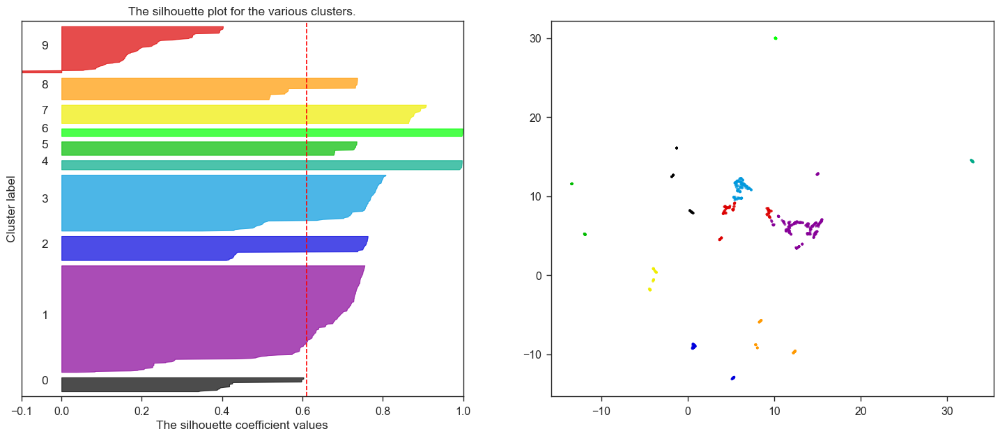

For n_clusters = 11 The average silhouette_score is : 0.62229496


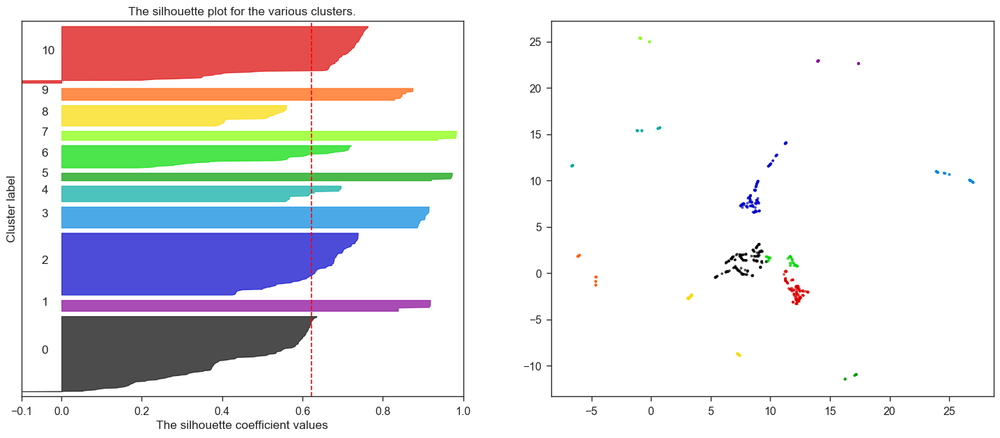

For n_clusters = 12 The average silhouette_score is : 0.6049854


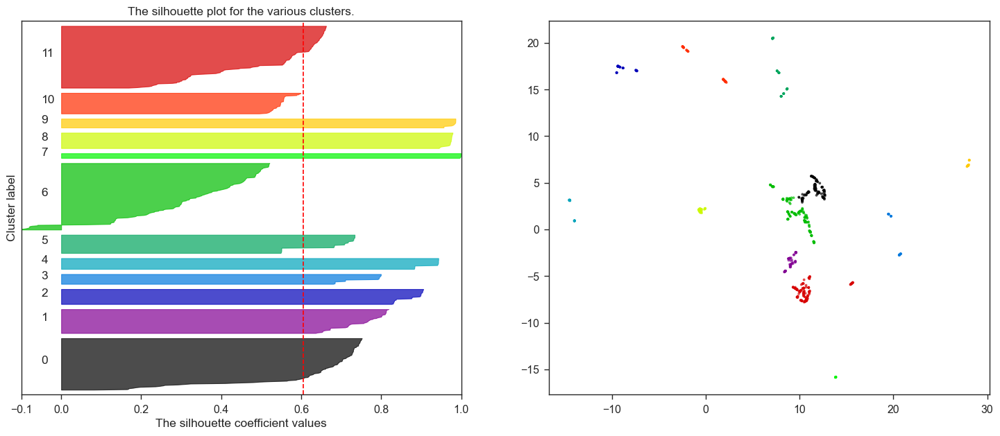

For n_clusters = 13 The average silhouette_score is : 0.6894789


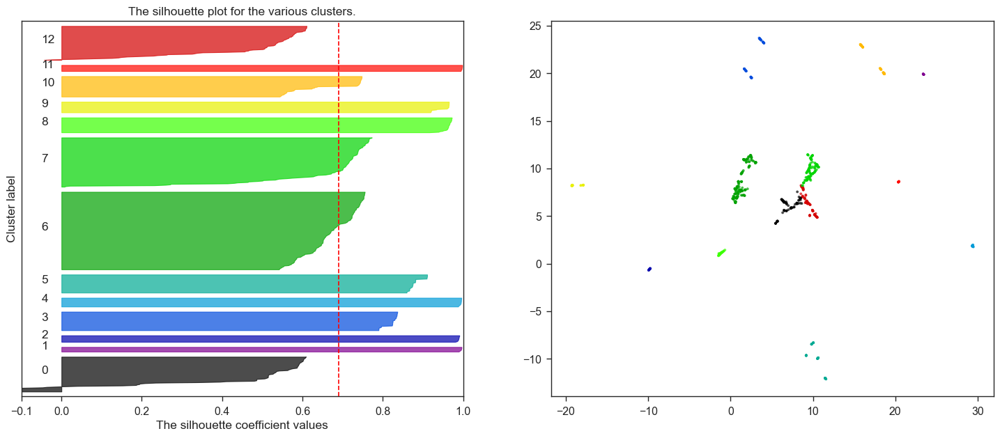

For n_clusters = 14 The average silhouette_score is : 0.66645074


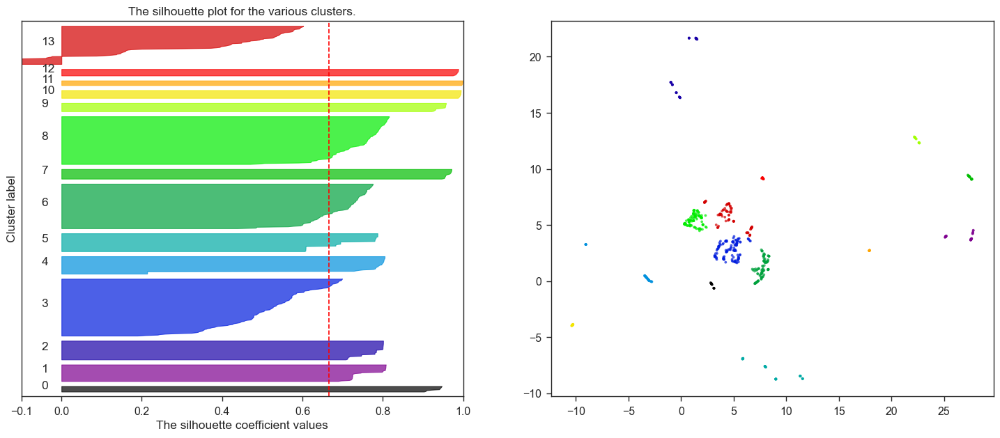

For n_clusters = 15 The average silhouette_score is : 0.62215143


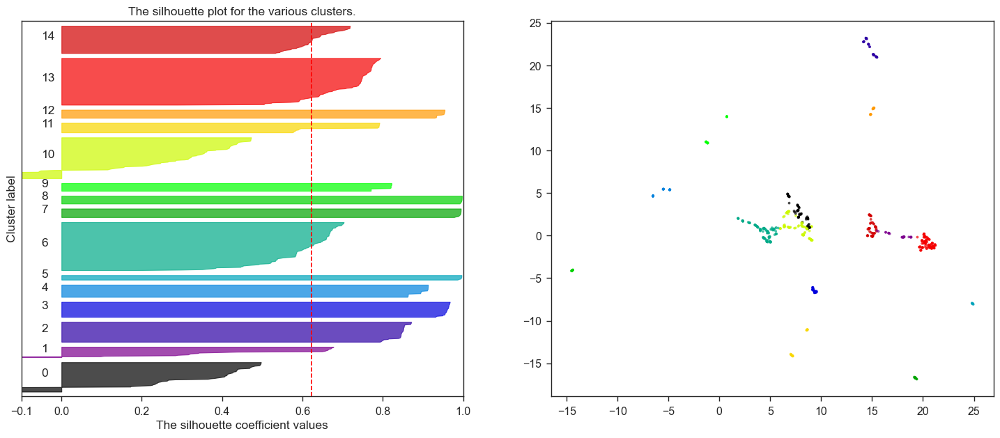

For n_clusters = 16 The average silhouette_score is : 0.70006275


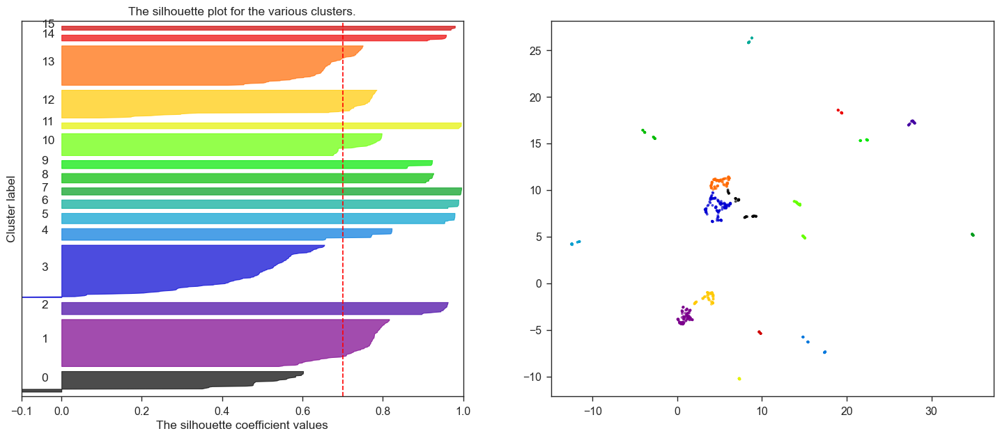

For n_clusters = 17 The average silhouette_score is : 0.7042482


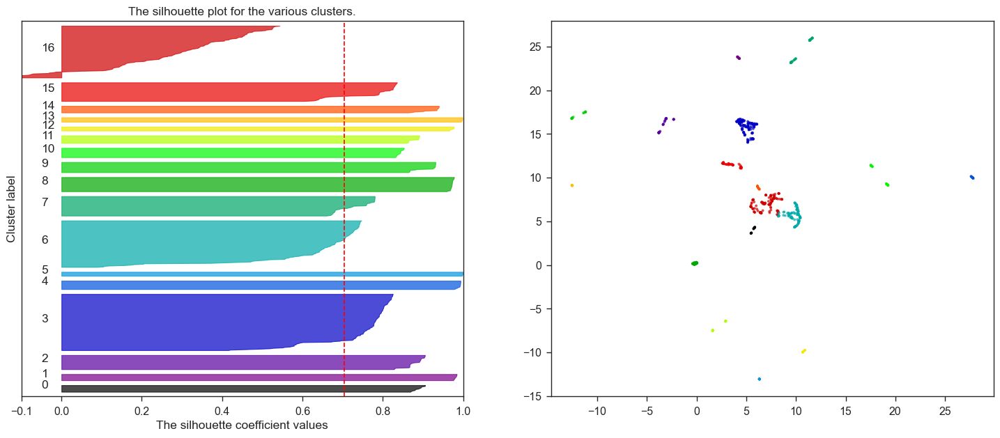

For n_clusters = 18 The average silhouette_score is : 0.74582154


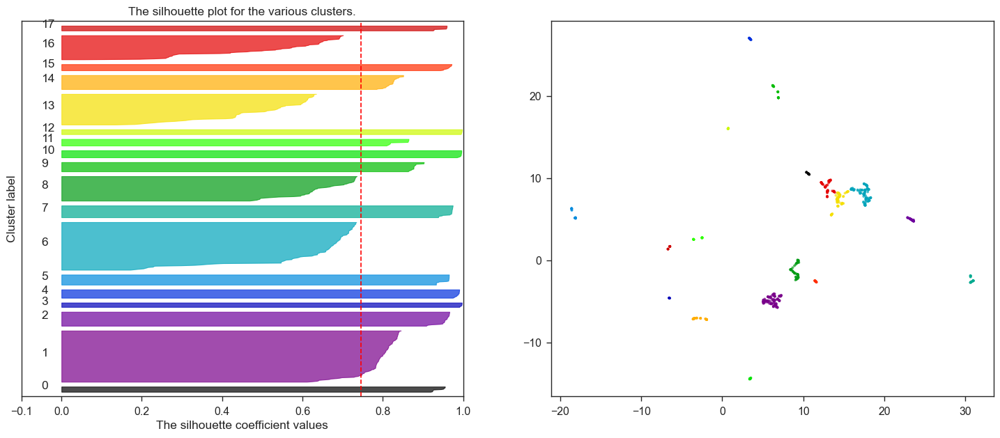

For n_clusters = 19 The average silhouette_score is : 0.715706


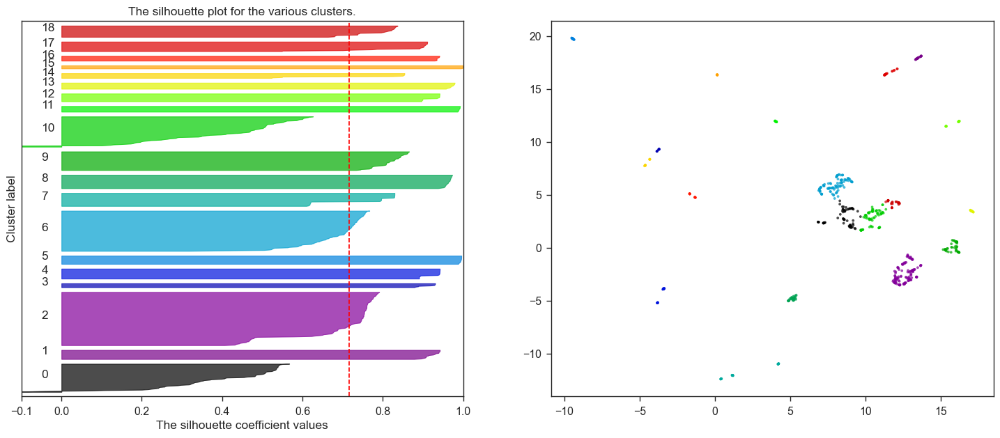

For n_clusters = 20 The average silhouette_score is : 0.7028512


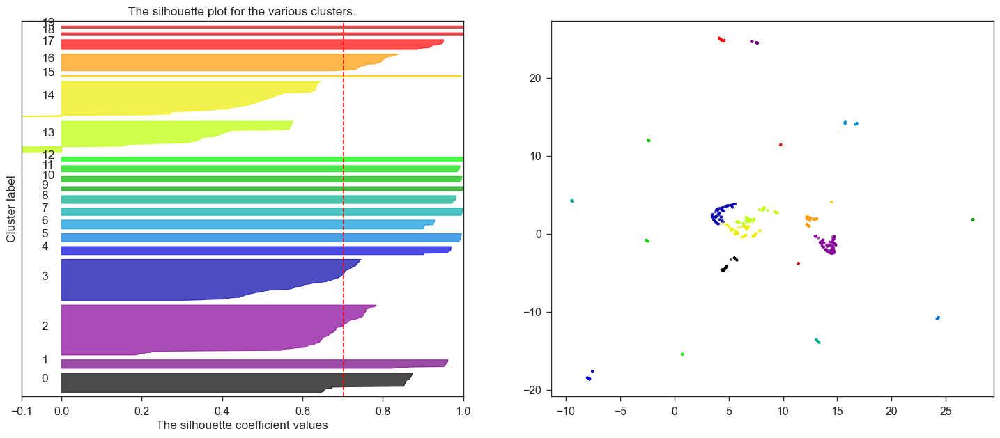

For n_clusters = 21 The average silhouette_score is : 0.6293534


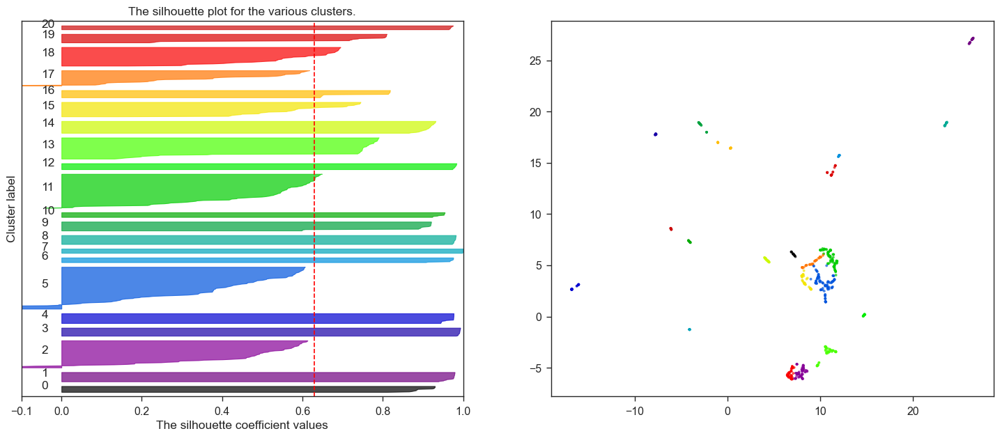

For n_clusters = 22 The average silhouette_score is : 0.62452316


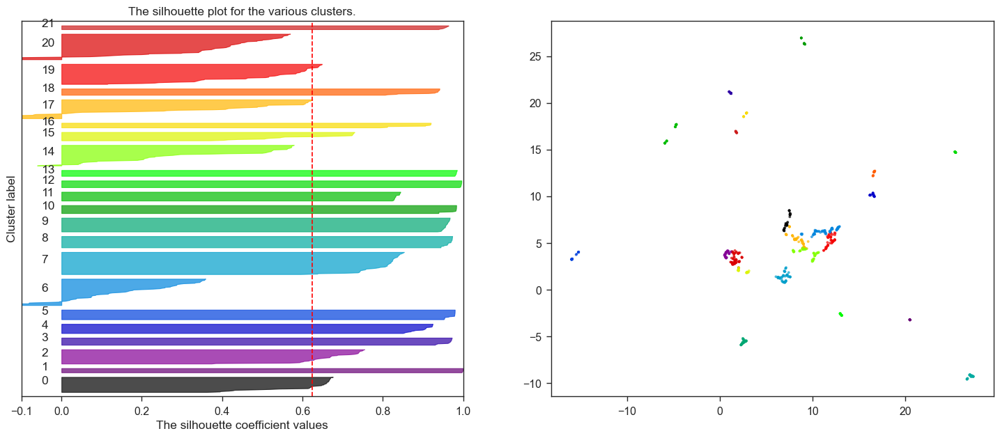

For n_clusters = 23 The average silhouette_score is : 0.70549375


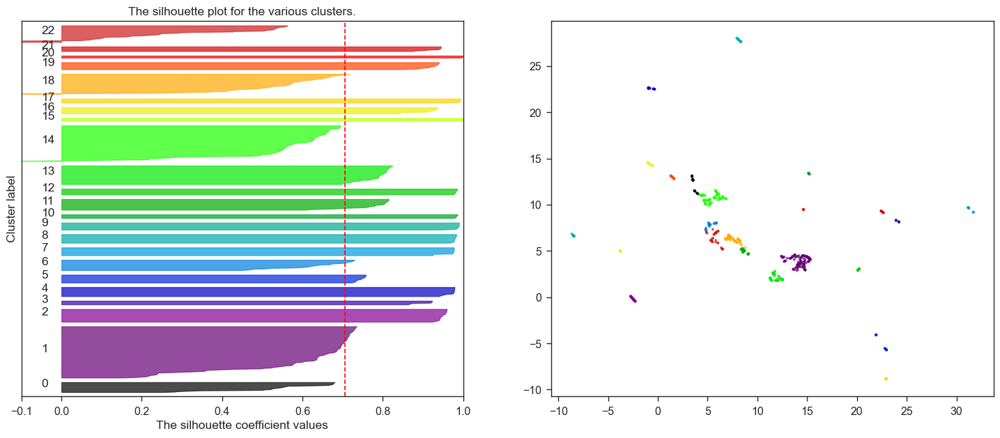

For n_clusters = 24 The average silhouette_score is : 0.64981526


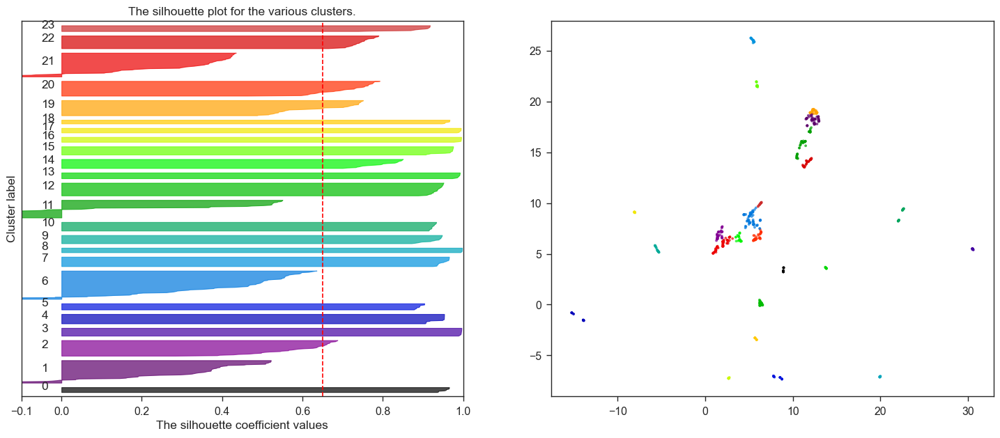

For n_clusters = 25 The average silhouette_score is : 0.662185


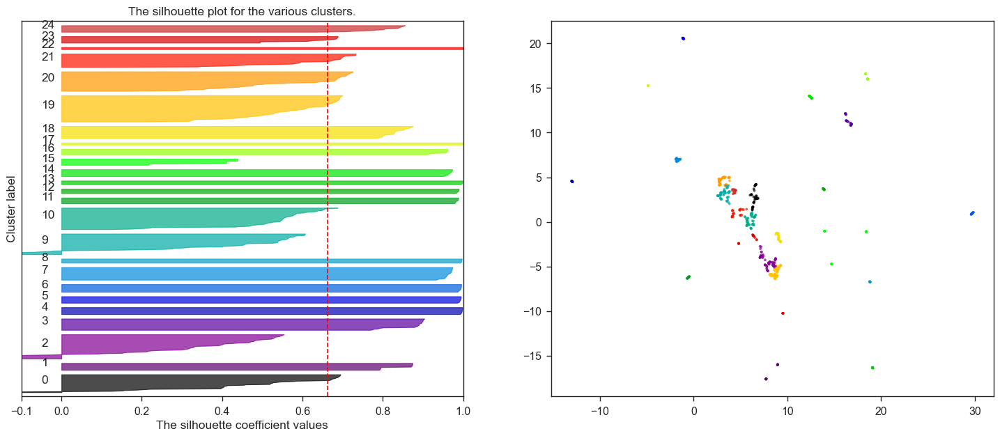

In [119]:
# plot_silhouette для каждой кластеризации (с разным количеством кластеров)

freq = '60S'

for n_clusters in range(min_clusters, max_clusters + 1):
    
    x_embed = embeds_and_labels_per_freqAndClustrersCount_n2d[freq][n_clusters][0]

    cluster_labels = embeds_and_labels_per_freqAndClustrersCount_n2d[freq][n_clusters][1]

    plot_silhouette(x_embed, cluster_labels, n_clusters)

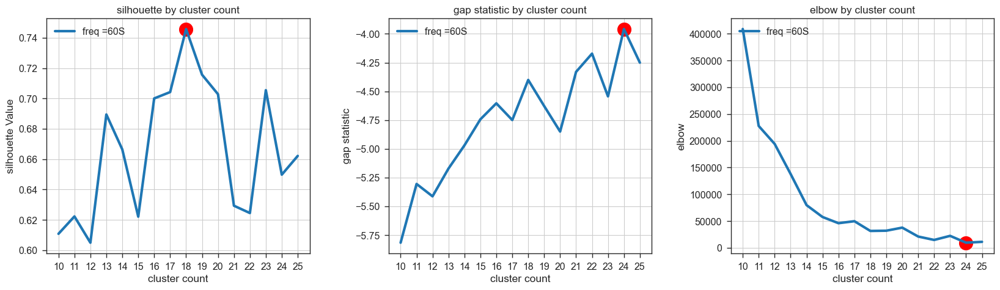

In [120]:
# графики метрик качества кластеризации (коэффициент силуэта, calinski harabasz score, davies bouldin score) 
# для заданной частоты в зависимости от количества кластеров 

c_m = clusterization_metrics_n2d

min_optim_freqs = ['60S']

for freq in min_optim_freqs:

    plt.figure(figsize=(20, 5))
    plt.subplots_adjust(wspace=0.3)
    
    plt.subplot(1,3,1)
    silhouettes = pd.to_numeric(c_m.loc[min_clusters:max_clusters, (freq, 'silhouette')])
    plot_silhouettes(silhouettes)

    plt.subplot(1,3,2)
    gap_statistics = pd.to_numeric(c_m.loc[min_clusters:max_clusters, (freq, 'gap_statistic')])
    plot_gap_statistics(gap_statistics)

    plt.subplot(1,3,3)
    elbows = pd.to_numeric(c_m.loc[min_clusters:max_clusters, (freq, 'elbow')])
    plot_elbows(elbows)

In [121]:
# сохраняем/загружаем metrics

metrics_n2d = metrics
#metrics_idec = metrics
#metrics_kshape = metrics

with open('metrics_n2d.pkl', 'wb') as f:
    pickle.dump(metrics_n2d, f)
#with open('metrics_kshape.pkl', 'wb') as f:
#    pickle.dump(metrics_kshape, f)
#with open('metrics_idec.pkl', 'wb') as f:
#    pickle.dump(metrics_idec, f)
    
#with open('metrics_n2d.pkl', 'rb') as f:
#with open('metrics_idec.pkl', 'rb') as f:
#with open('metrics_kshape.pkl', 'rb') as f:
#    loaded_dict = pickle.load(f)

In [122]:
# вывод метрик качества кластеризации (коэффициент силуэта, calinski harabasz score, davies bouldin score)
# для каждой кластеризации и лучшей кластеризации для каждой метрики
# В metrics задается список значений метрик моделей (n2d, idec, kshape) и их частоты для которых будут выводиться метрики

#metrics = [(metrics_n2d, 'metrics_n2d', ['60S']), 
#           (metrics_idec, 'metrics_idec', ['60S']), 
#           (metrics_kshape, 'metrics_kshape', ['60S', '650S'])]

metrics = [(metrics_n2d, 'metrics_n2d', ['60S'])]

for (metric, name, freqs) in metrics:
    
    print(name)
    
    for freq in freqs:
        print(metric)
        print()
        print('max silhouette_score  ' 
              + pd.to_numeric(metric[freq]['silhouette_score']).idxmax() + '  ' 
              + str(pd.to_numeric(metric[freq]['silhouette_score']).max()))
        print('max calinski_harabasz_score  ' 
              + pd.to_numeric(metric[freq]['calinski_harabasz_score']).idxmax() + '  ' 
              + str(pd.to_numeric(metric[freq]['calinski_harabasz_score']).max()))
        print('min davies_bouldin_score  ' 
              + pd.to_numeric(metric[freq]['davies_bouldin_score']).idxmin() + '  ' 
              + str(pd.to_numeric(metric[freq]['davies_bouldin_score']).min()))
    

metrics_n2d
{'60S':              silhouette_score calinski_harabasz_score davies_bouldin_score
10 кластеров         0.610845             1723.754966             0.572059
11 кластеров         0.622295             1736.529654             0.457622
12 кластеров         0.604985               2527.3687             0.464274
13 кластеров         0.689479             3522.763903             0.338816
14 кластеров         0.666451             2719.444683               0.3763
15 кластеров         0.622151             4954.003759             0.461126
16 кластеров         0.700063             6598.438263             0.314085
17 кластеров         0.704248             5106.585019             0.274014
18 кластеров         0.745822             11115.28104             0.256962
19 кластеров         0.715706             5040.733426             0.300807
20 кластеров         0.702851             6538.430371             0.252586
21 кластеров         0.629353              9756.07603              0.35108
22 кл

In [123]:
# сохранение/загрузка и вывод меток кластеров

tss_clasterizations_n2d = tss_clasterizations
#tss_clasterizations_idec = tss_clasterizations
#tss_clasterizations_kshape = tss_clasterizations

with open('tss_clasterizations_n2d.pkl', 'wb') as f:
    pickle.dump(tss_clasterizations_n2d, f)
#with open('tss_clasterizations_kshape.pkl', 'wb') as f:
#    pickle.dump(tss_clasterizations_kshape, f)
#with open('tss_clasterizations_idec.pkl', 'wb') as f:
#    pickle.dump(tss_clasterizations_idec, f)

#with open('tss_clasterizations_n2d.pkl', 'rb') as f:
#with open('tss_clasterizations_kshape.pkl', 'rb') as f:
#with open('tss_clasterizations_idec.pkl', 'rb') as f:
#    loaded_dict = pickle.load(f)

tss_clasterizations_n2d

60S                            \
                                10 кластеров 11 кластеров 12 кластеров   
ActivMetric1__WEEK                         1            0            6   
jmxmetric__NONE                            1            0            6   
monitoringMetric$106541__NONE              1            0            6   
monitoringMetric$116101__WEEK              1            0            6   
monitoringMetric$116104__WEEK              1            2            0   
...                                      ...          ...          ...   
monitoringMetric$27568701__WEEK            7            2            2   
monitoringMetric$27568702__WEEK            7            2            2   
ndapFree__MONTH                            1            0            6   
ndapFree_freq__MONTH                       1            0            6   
test__NONE                                 1            0            6   

                                                                        \
                                13 кластеров 14 кластеров 15 кластеров   
ActivMetric1__WEEK                        12            3           10   
jmxmetric__NONE                           12           13           10   
monitoringMetric$106541__NONE             12           13           10   
monitoringMetric$116101__WEEK             12           13           10   
monitoringMetric$116104__WEEK             12            3           10   
...                                      ...          ...          ...   
monitoringMetric$27568701__WEEK            3            9           12   
monitoringMetric$27568702__WEEK            3            9           12   
ndapFree__MONTH                            0            3            0   
ndapFree_freq__MONTH                       0            3           10   
test__NONE                                 0            3           10   

                                                                        \
                                16 кластеров 17 кластеров 18 кластеров   
ActivMetric1__WEEK                         3           16           13   
jmxmetric__NONE                            0           14           13   
monitoringMetric$106541__NONE              0           14           13   
monitoringMetric$116101__WEEK              0           16           13   
monitoringMetric$116104__WEEK              3            6           13   
...                                      ...          ...          ...   
monitoringMetric$27568701__WEEK            9            2           14   
monitoringMetric$27568702__WEEK            9            2           14   
ndapFree__MONTH                            3           16           13   
ndapFree_freq__MONTH                       3           16           13   
test__NONE                                 3           16           13   

                                              ...                            \
                                19 кластеров  ... 23 кластеров 24 кластеров   
ActivMetric1__WEEK                        10  ...           18            6   
jmxmetric__NONE                           18  ...           11           23   
monitoringMetric$106541__NONE             18  ...           11           23   
monitoringMetric$116101__WEEK             18  ...           11            6   
monitoringMetric$116104__WEEK              0  ...            6           14   
...                                      ...  ...          ...          ...   
monitoringMetric$27568701__WEEK           12  ...           16           17   
monitoringMetric$27568702__WEEK           12  ...           16           17   
ndapFree__MONTH                           10  ...           18            6   
ndapFree_freq__MONTH                      10  ...           18            6   
test__NONE                                10  ...           18            6   

                                                                     \
                                3 кластеров 4 кластер

<br><br>
визуализируем кластеры в 2-мерном пространстве (размерность эмбеддингов рядов) для определенной частоты и кластеризации:

In [ ]:
freq = '60S'
n_clusters = max_clusters

x = embeds_and_labels_per_freqAndClustrersCount_n2d[freq][n_clusters][0]

visualize_clusters(x, labels)

<br><br>
выведем ряды в каждом кластере для заданной кластеризации (число кластеров), модели, частоты и периода:

In [ ]:
freq = '60S'
n_clusters = max_clusters
period = 'WEEK'

plot_tss_in_clusters(clipped_period_group_ts,       #r_i_c_s_freq_period_group_ts - предобработанные ряды
                     tss_clasterizations_n2d,       #clipped_period_group_ts - ряды без предобработки, только с усечением
                     freq, period, n_clusters,  
                     kind=['all'],
                     algo='n2d')
